In [1]:
import igraph
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
import matplotlib.patches as mpatches
import os
os.chdir("../src")
from build_network_object import build_network_object
from draw_network_by_classification import draw_network_by_classification, compare_degrees_strength
from draw_adjacency_matrix import draw_adjacency_matrix
from draw_and_print_communities import draw_and_print_communities, compare_comunity_intersection
from correlations import correlation_industry_pairs, correlation_network_degree,correlation_adjacency_matrix
import seaborn as sns

# Comparison between Flows and Connection algorithms for 2009-2018 matrices 

## Flows


In [2]:
label1 = "Table1_Reduced_matrix_2009_2018_flows"
reduced_matrix_2009_2018 = pd.read_csv("../data/"+label1+".csv", index_col=0)

reduced_matrix_2009_2018_flows = reduced_matrix_2009_2018[reduced_matrix_2009_2018['StartIndst']!=0]

sub_matrix_2009_2018_less1 = reduced_matrix_2009_2018_flows[reduced_matrix_2009_2018_flows['weight']<1].sort_values(by=['weight'], ascending=False)
sub_matrix_2009_2018_flows = sub_matrix_2009_2018_less1[sub_matrix_2009_2018_less1['weight']>0].sort_values(by=['weight'], ascending=False)

print ("Number of links:", sub_matrix_2009_2018_flows.shape[0]/2)
print ("Number of 4-digit industries observed:")
print (len(np.unique([sub_matrix_2009_2018_flows['StartIndst'].values,sub_matrix_2009_2018_flows['FinalIndst'].values])))
sub_matrix_2009_2018_flows[1:15]

Number of links: 1153.0
Number of 4-digit industries observed:
356


,StartIndst,FinalIndst,weight,SubActivity_StartIndst,SubActivity_FinalIndst,MainActivity_StartIndst,MainActivity_FinalIndst,MainIndustry_StartIndst,MainIndustry_FinalIndst,Counts
4302,4611,4623,0.999931,"Agriculture, animals, raw goods",Live animals,Fee/contract - wholesale,Agricultural wholesale,"Wholesale and retail,motor vehicle repair,sale...","Wholesale and retail,motor vehicle repair,sale...",10
4281,2732,2731,0.999828,"Other electronic, electric wires",Fibre optic cables,Electrical equipment,Electrical equipment,"Manufacture computer, electronic, light electr...","Manufacture computer, electronic, light electr...",10
4221,2731,2732,0.999821,Fibre optic cables,"Other electronic, electric wires",Electrical equipment,Electrical equipment,"Manufacture computer, electronic, light electr...","Manufacture computer, electronic, light electr...",11
4186,1813,1712,0.999697,"Pre-press, pre-media services","Paper, paperboard",Printing,Paper and paper products,All other Manufacturing,All other Manufacturing,10
4137,1712,1813,0.999649,"Paper, paperboard","Pre-press, pre-media services",Paper and paper products,Printing,All other Manufacturing,All other Manufacturing,18
3986,3040,3311,0.999642,Military fighting vehicles,Fabricated metal products,Other transport equipment,Repair/installation excl. household,"Manufacture machinery, vehicle, transport",Machinery repair excluding motor vehicles,10
4169,2899,2620,0.999599,Other,"Computers, peripheral equipment",Special purpose machinery,"Computer, electronic, optical","Manufacture machinery, vehicle, transport","Manufacture computer, electronic, light electr...",15
4218,2620,2899,0.999597,"Computers, peripheral equipment",Other,"Computer, electronic, optical",Special purpose machinery,"Manufacture computer, electronic, light electr...","Manufacture machinery, vehicle, transport",12
4276,2312,2311,0.999567,"Flat glass shaping, processing",Flat glass manufacture,Glass products,Glass products,All other Manufacturing,All other Manufacturing,10
4304,3311,3040,0.999539,Fabricated metal products,Military fighting vehicles,Repair/installation excl. household,Other transport equipment,Machinery repair excluding motor vehicles,"Manufacture machinery, vehicle, transport",25


## Connections


In [3]:
label2 = "Table2_Reduced_matrix_2009_2018_connections"
reduced_matrix_2009_2018_conn = pd.read_csv("../data/"+label2+".csv", index_col=0)

reduced_matrix_2009_2018_conn = reduced_matrix_2009_2018_conn[reduced_matrix_2009_2018_conn['StartIndst']!=0]


sub_matrix_2009_2018_conn_less1 = reduced_matrix_2009_2018_conn[reduced_matrix_2009_2018_conn['weight']<1]
sub_matrix_2009_2018_conn = sub_matrix_2009_2018_conn_less1[sub_matrix_2009_2018_conn_less1['weight']>0]

print ("Number of links:", sub_matrix_2009_2018_conn.shape[0]/2)
print ("Number of 4-digit industries observed:")
print (len(np.unique([sub_matrix_2009_2018_conn['StartIndst'].values,sub_matrix_2009_2018_conn['FinalIndst'].values])))

sub_matrix_2009_2018_conn.sort_values(by=['weight'], ascending=False)[1:15]



Number of links: 1507.0
Number of 4-digit industries observed:
369


,StartIndst,FinalIndst,weight,SubActivity_StartIndst,SubActivity_FinalIndst,MainActivity_StartIndst,MainActivity_FinalIndst,MainIndustry_StartIndst,MainIndustry_FinalIndst,Counts
5087,4611,4623,0.999919,"Agriculture, animals, raw goods",Live animals,Fee/contract - wholesale,Agricultural wholesale,"Wholesale and retail,motor vehicle repair,sale...","Wholesale and retail,motor vehicle repair,sale...",10
5068,2732,2731,0.999858,"Other electronic, electric wires",Fibre optic cables,Electrical equipment,Electrical equipment,"Manufacture computer, electronic, light electr...","Manufacture computer, electronic, light electr...",10
5025,2731,2732,0.999858,Fibre optic cables,"Other electronic, electric wires",Electrical equipment,Electrical equipment,"Manufacture computer, electronic, light electr...","Manufacture computer, electronic, light electr...",12
5060,142,141,0.999789,"Raising of other cattle, buffaloes",Raising of dairy cattle,"Animal production, hunting","Animal production, hunting","Agriculture, Forestry, Fishing, Veterinary","Agriculture, Forestry, Fishing, Veterinary",11
5082,141,142,0.999789,Raising of dairy cattle,"Raising of other cattle, buffaloes","Animal production, hunting","Animal production, hunting","Agriculture, Forestry, Fishing, Veterinary","Agriculture, Forestry, Fishing, Veterinary",10
4910,1712,1813,0.999712,"Paper, paperboard","Pre-press, pre-media services",Paper and paper products,Printing,All other Manufacturing,All other Manufacturing,18
4975,1813,1712,0.999712,"Pre-press, pre-media services","Paper, paperboard",Printing,Paper and paper products,All other Manufacturing,All other Manufacturing,10
4912,2362,812,0.999663,Plaster products for construction,"Gravel, sand pits; clays, kaolin","Concrete, cement and plaster","Mining, Quarrying and other",All other Manufacturing,"Mining, Quarrying (inc extraction of petroleum...",15
4987,812,2362,0.999663,"Gravel, sand pits; clays, kaolin",Plaster products for construction,"Mining, Quarrying and other","Concrete, cement and plaster","Mining, Quarrying (inc extraction of petroleum...",All other Manufacturing,20
5101,3311,3040,0.999650,Fabricated metal products,Military fighting vehicles,Repair/installation excl. household,Other transport equipment,Machinery repair excluding motor vehicles,"Manufacture machinery, vehicle, transport",36


/Users/crangelsmith/PycharmProjects/KnowledgeFlows/python/labour_flows_matrix/src/correlations.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df_industry1['id'] = df_industry1.groupby(['StartIndst', 'FinalIndst']).ngroup()
/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


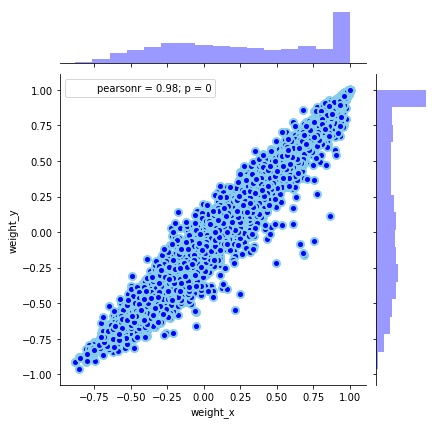

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


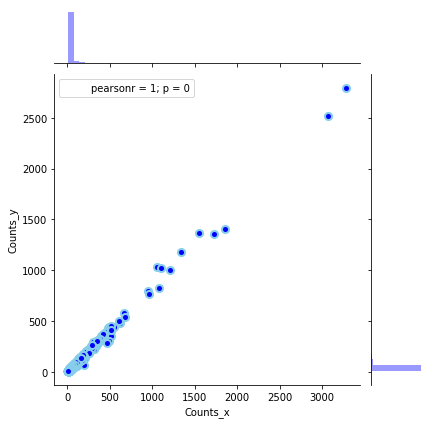

In [4]:
correlation_industry_pairs(sub_matrix_2009_2018_conn_less1,sub_matrix_2009_2018_less1)


correlation_industry_pairs(sub_matrix_2009_2018_conn_less1,sub_matrix_2009_2018_less1,'counts')


/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


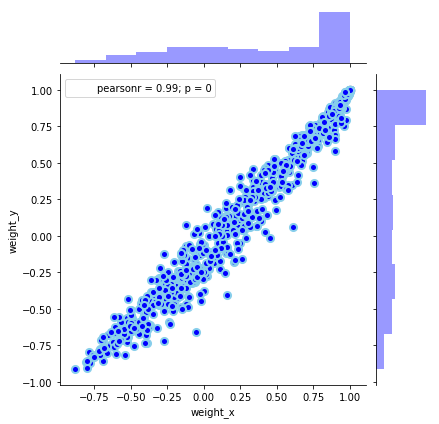

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


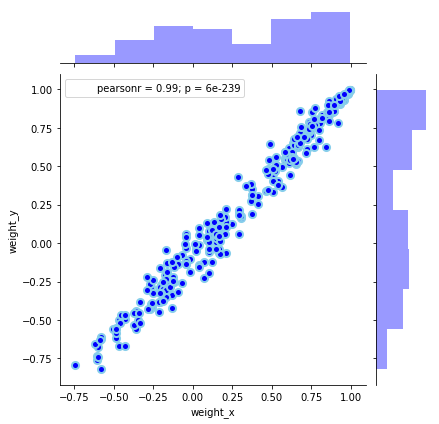

In [5]:
correlation_industry_pairs(sub_matrix_2009_2018_conn_less1[sub_matrix_2009_2018_conn_less1['Counts']<11],sub_matrix_2009_2018_less1,'weight')


correlation_industry_pairs(sub_matrix_2009_2018_conn_less1[sub_matrix_2009_2018_conn_less1['Counts']>100],sub_matrix_2009_2018_less1,'weight')


In [6]:
Gm_simple_2009_2018_flows = build_network_object(reduced_matrix_2009_2018_flows,'weight')
Gm_simple_2009_2018_conn = build_network_object(reduced_matrix_2009_2018_conn,'weight')

## Degree comparison:

NETWORK OF flows


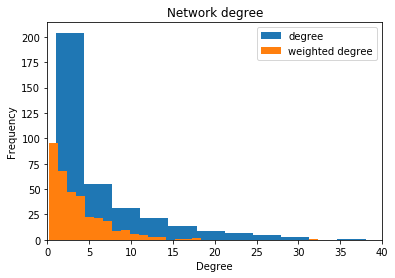

mean degree 6.921348314606742
mean strenght 3.8418144218080057


NETWORK OF connections


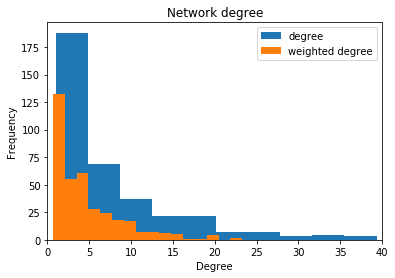

mean degree 8.168021680216802
mean strenght 4.775402312637026


In [7]:
print ('NETWORK OF flows')
compare_degrees_strength(Gm_simple_2009_2018_flows)
print()
print()
print ('NETWORK OF connections')
compare_degrees_strength(Gm_simple_2009_2018_conn)

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


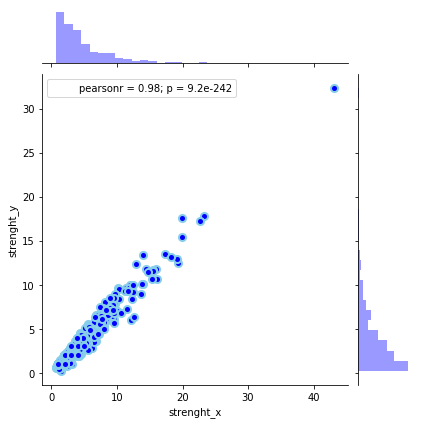

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


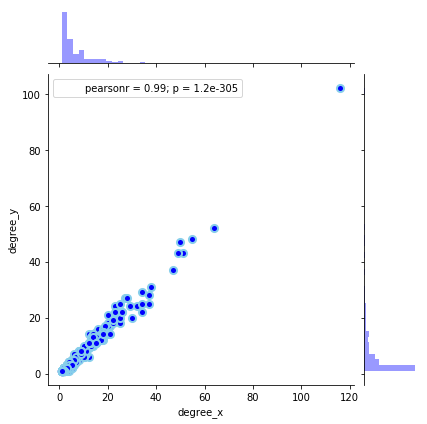

In [8]:
correlation_network_degree(Gm_simple_2009_2018_conn,Gm_simple_2009_2018_flows,'strength')
correlation_network_degree(Gm_simple_2009_2018_conn,Gm_simple_2009_2018_flows,'degree')


## Adjacency matrix:
### Flows:

In [9]:
draw_adjacency_matrix(reduced_matrix_2009_2018_flows,['StartIndst','FinalIndst'],'weight')

### Connections:

In [10]:
draw_adjacency_matrix(reduced_matrix_2009_2018_conn,['StartIndst','FinalIndst'],'weight')

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


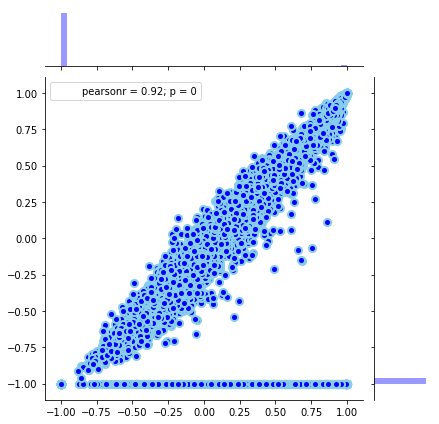

adjacency matrix correlation
(0.9222438261843565, 0.0)
percentage of the entries with non-symetrical missigness
0.403484408534276


In [25]:
correlation_adjacency_matrix(reduced_matrix_2009_2018_conn,reduced_matrix_2009_2018_flows,'weight')

# Network visualisation: by main industry

im here
im here


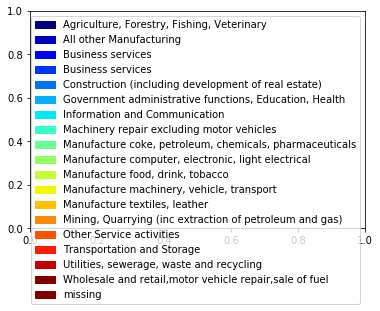

0

In [26]:
draw_network_by_classification(Gm_simple_2009_2018_flows,'mainindustry','../img/'+label1+'/network_industry.png')

![title](../img/Table1_Reduced_matrix_2009_2018_flows/network_industry.png)


im here
im here


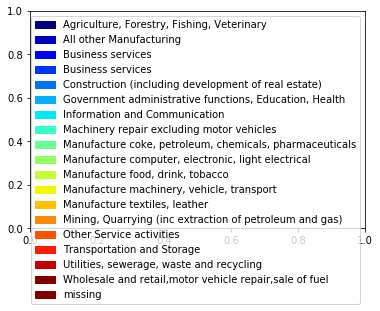

0

In [27]:
draw_network_by_classification(Gm_simple_2009_2018_conn,'mainindustry','../img/'+label2+'/network_industry.png')

![title](../img/Table3_Reduced_matrix_2009_2018_flows/network_industry.png)


## Network visualisation: by community
## Flows:

In [28]:
network_components_2009_2018_flows = Gm_simple_2009_2018_flows.components()
network_largest_2009_2018_flows = network_components_2009_2018_flows.subgraphs()[0]


In [29]:
net_community_2009_2018_flows = network_largest_2009_2018_flows.community_multilevel(weights=network_largest_2009_2018_flows.es['weight'])
print ('Modularity',net_community_2009_2018_flows.modularity)

Modularity 0.6141638317484153


In [30]:
list_communities_flows = draw_and_print_communities(network_largest_2009_2018_flows,net_community_2009_2018_flows,'../img/'+label1+'/network_community.png','mainindustry')

Community : 1
['Agriculture, Forestry, Fishing, Veterinary' 'Business services'
 'Government administrative functions, Education, Health'
 'Other Service activities'
 'Wholesale and retail,motor vehicle repair,sale of fuel' 'missing']

Community : 2
['Government administrative functions, Education, Health'
 'Other Service activities']

Community : 3
['Business services' 'Business services '
 'Construction (including development of real estate)'
 'Information and Communication' 'Manufacture food, drink, tobacco'
 'Other Service activities'
 'Wholesale and retail,motor vehicle repair,sale of fuel']

Community : 4
['All other Manufacturing' 'Business services'
 'Manufacture machinery, vehicle, transport' 'Transportation and Storage'
 'Wholesale and retail,motor vehicle repair,sale of fuel']

Community : 5
['Agriculture, Forestry, Fishing, Veterinary' 'All other Manufacturing'
 'Business services' 'Construction (including development of real estate)'
 'Manufacture computer, electronic, lig

## Connections:



In [31]:
network_components_2009_2018_conn = Gm_simple_2009_2018_conn.components()
network_largest_2009_2018_conn = network_components_2009_2018_conn.subgraphs()[0]
net_community_2009_2018_conn = network_largest_2009_2018_conn.community_multilevel(weights=network_largest_2009_2018_conn.es['weight'])
print ('Modularity',net_community_2009_2018_conn.modularity)

Modularity 0.575052599872221


In [32]:
list_communities_conn = draw_and_print_communities(network_largest_2009_2018_conn,net_community_2009_2018_conn,'../img/'+label2+'/network_community.png','mainindustry')

Community : 1
['Agriculture, Forestry, Fishing, Veterinary' 'Business services'
 'Government administrative functions, Education, Health'
 'Information and Communication' 'Other Service activities']

Community : 2
['All other Manufacturing' 'Business services'
 'Government administrative functions, Education, Health'
 'Information and Communication' 'Manufacture textiles, leather'
 'Other Service activities' 'Transportation and Storage'
 'Wholesale and retail,motor vehicle repair,sale of fuel']

Community : 3
['All other Manufacturing' 'Business services' 'Business services '
 'Construction (including development of real estate)'
 'Information and Communication' 'Manufacture food, drink, tobacco'
 'Manufacture machinery, vehicle, transport'
 'Wholesale and retail,motor vehicle repair,sale of fuel']

Community : 4
['Agriculture, Forestry, Fishing, Veterinary' 'All other Manufacturing'
 'Business services' 'Manufacture computer, electronic, light electrical'
 'Manufacture food, drink, to

### Flows:

!['something here'](../img/Table1_Reduced_matrix_2009_2018_flows/network_community.png)


### Connections:


![title](../img/Table2_Reduced_matrix_2009_2018_connections/network_community.png)


In [33]:
print (list_communities_conn[1])
print (list_communities_flows[0])

['All other Manufacturing' 'Business services'
 'Government administrative functions, Education, Health'
 'Information and Communication' 'Manufacture textiles, leather'
 'Other Service activities' 'Transportation and Storage'
 'Wholesale and retail,motor vehicle repair,sale of fuel']
['Agriculture, Forestry, Fishing, Veterinary' 'Business services'
 'Government administrative functions, Education, Health'
 'Other Service activities'
 'Wholesale and retail,motor vehicle repair,sale of fuel' 'missing']


In [34]:
compare_comunity_intersection(list_communities_conn,list_communities_flows,'Connections','Flows')

In [35]:
compare_comunity_intersection(list_communities_flows,list_communities_conn,'Flows','Connections')

# Example of comparison of a network community with itself

In [36]:
network_components_2009_2018_conn2 = Gm_simple_2009_2018_conn.components()
network_largest_2009_2018_conn2 = network_components_2009_2018_conn2.subgraphs()[0]
net_community_2009_2018_conn2 = network_largest_2009_2018_conn2.community_multilevel(weights=network_largest_2009_2018_conn2.es['weight'])
print ('Modularity',net_community_2009_2018_conn2.modularity)

list_communities_conn2 = draw_and_print_communities(network_largest_2009_2018_conn2,net_community_2009_2018_conn2,'../img/'+label2+'/network_community.png','mainindustry')

Modularity 0.575052599872221
Community : 1
['Agriculture, Forestry, Fishing, Veterinary' 'Business services'
 'Government administrative functions, Education, Health'
 'Information and Communication' 'Other Service activities']

Community : 2
['All other Manufacturing' 'Business services'
 'Government administrative functions, Education, Health'
 'Information and Communication' 'Manufacture textiles, leather'
 'Other Service activities' 'Transportation and Storage'
 'Wholesale and retail,motor vehicle repair,sale of fuel']

Community : 3
['All other Manufacturing' 'Business services' 'Business services '
 'Construction (including development of real estate)'
 'Information and Communication' 'Manufacture food, drink, tobacco'
 'Manufacture machinery, vehicle, transport'
 'Wholesale and retail,motor vehicle repair,sale of fuel']

Community : 4
['Agriculture, Forestry, Fishing, Veterinary' 'All other Manufacturing'
 'Business services' 'Manufacture computer, electronic, light electrical'


In [37]:
compare_comunity_intersection(list_communities_conn,list_communities_conn2,'Connections','Connections2')